In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical

# Define the path to the dataset
dataset_path = "fer_emotion"

# Emotion labels
emotion_labels = ['Angry', 'Disgust', 'Fear', 'Happy', 'Sad', 'Surprise', 'Neutral']

# Image size
IMG_SIZE = 48

# Function to load images and labels
def load_data(dataset_path):
    images = []
    labels = []
    for label in emotion_labels:
        folder_path = os.path.join(dataset_path, label)
        for filename in os.listdir(folder_path):
            img_path = os.path.join(folder_path, filename)
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
            if img is not None:
                img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
                img = img.astype('float32') / 255.0  # Normalize the image
                images.append(img)
                labels.append(emotion_labels.index(label))
            else:
                print(f"Warning: Unable to read image {img_path}")
    images = np.array(images)
    labels = np.array(labels)
    return images, labels

# Function to detect outliers using z-score
def detect_outliers(data):
    mean = np.mean(data, axis=0)
    std_dev = np.std(data, axis=0)
    z_scores = np.abs((data - mean) / std_dev)
    return np.where(z_scores > 3)  # Consider z-score > 3 as outliers

# Load training and testing data
train_images, train_labels = load_data(os.path.join(dataset_path, 'train'))
test_images, test_labels = load_data(os.path.join(dataset_path, 'test'))

# Reshape images for the model
train_images = train_images.reshape(-1, IMG_SIZE, IMG_SIZE, 1)
test_images = test_images.reshape(-1, IMG_SIZE, IMG_SIZE, 1)

# Flatten the images for the box plot
flat_train_images = train_images.flatten()

# Plot box plot for pixel values before removing outliers
plt.figure(figsize=(10, 5))
sns.boxplot(flat_train_images)
plt.title('Box Plot of Pixel Values Before Removing Outliers')
plt.xlabel('Pixel Values')
plt.show()

# Detect and remove outliers in training data
outliers = detect_outliers(train_images)
train_images = np.delete(train_images, outliers, axis=0)
train_labels = np.delete(train_labels, outliers, axis=0)

# Data Augmentation
datagen = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
)


Data Types:
 float32

Missing Values: 0


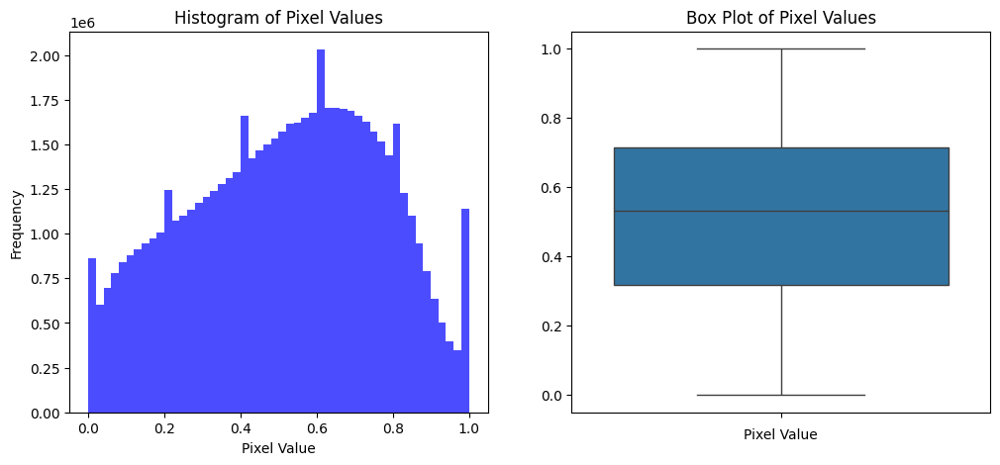

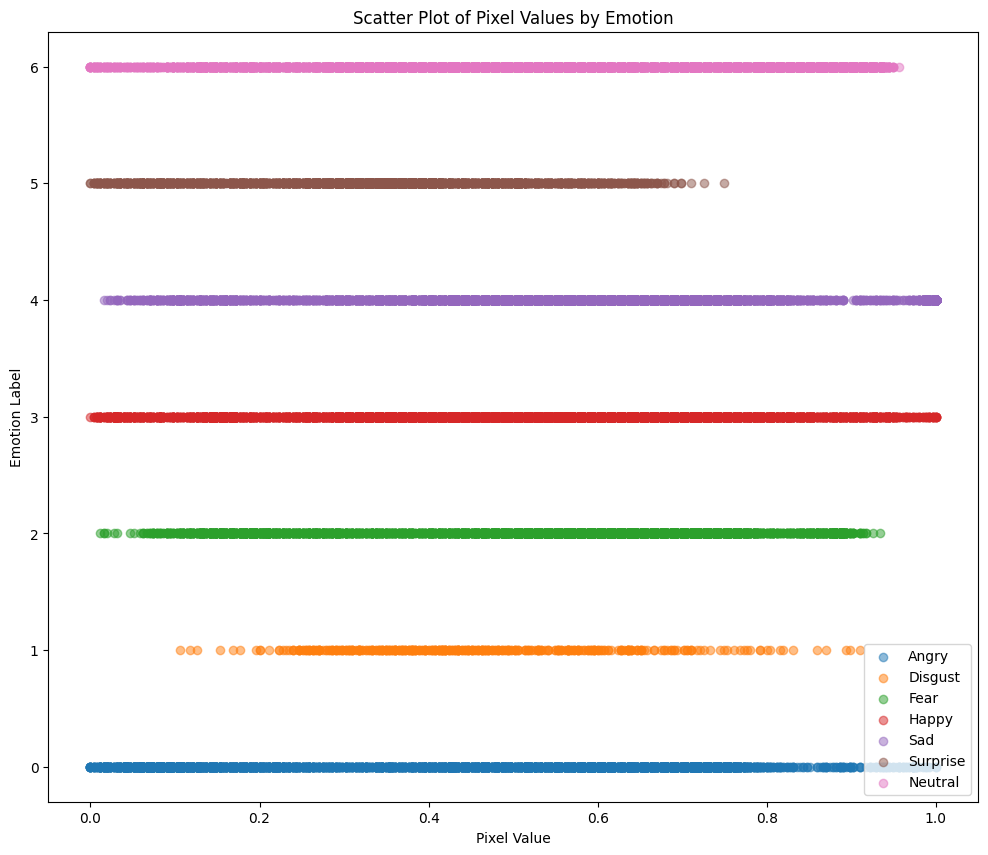

In [ ]:

# Fit the data generator on the training data
datagen.fit(train_images)

# Convert labels to categorical (one-hot encoding)
train_labels = to_categorical(train_labels, num_classes=len(emotion_labels))
test_labels = to_categorical(test_labels, num_classes=len(emotion_labels))

# Step 5: Check data types and missing values
def check_data_types_and_missing_values(data):
    print("Data Types:\n", data.dtype)
    print("\nMissing Values:", np.isnan(data).sum())

check_data_types_and_missing_values(train_images)

# Step 6: Visualize the Data
def visualize_data(train_images, train_labels):
    # Flatten the images for histogram and box plot
    flat_images = train_images.flatten()
    
    # Univariate Analysis
    plt.figure(figsize=(12, 5))
    
    # Histogram for distribution
    plt.subplot(1, 2, 1)
    plt.hist(flat_images, bins=50, color='blue', alpha=0.7)
    plt.title('Histogram of Pixel Values')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    
    # Box plot for outliers
    plt.subplot(1, 2, 2)
    sns.boxplot(flat_images)
    plt.title('Box Plot of Pixel Values')
    plt.xlabel('Pixel Value')
    
    plt.show()
    
    # Bivariate Analysis
    # Correlation heatmap is not applicable for 1D array, skipping it
    
    # Scatter plots for relationships
    plt.figure(figsize=(12, 10))
    for i, label in enumerate(emotion_labels):
        indices = np.where(np.argmax(train_labels, axis=1) == i)[0]
        plt.scatter(flat_images[indices], np.ones(len(indices))*i, label=label, alpha=0.5)
    
    plt.title('Scatter Plot of Pixel Values by Emotion')
    plt.xlabel('Pixel Value')
    plt.ylabel('Emotion Label')
    plt.legend()
    plt.show()

visualize_data(train_images, train_labels)


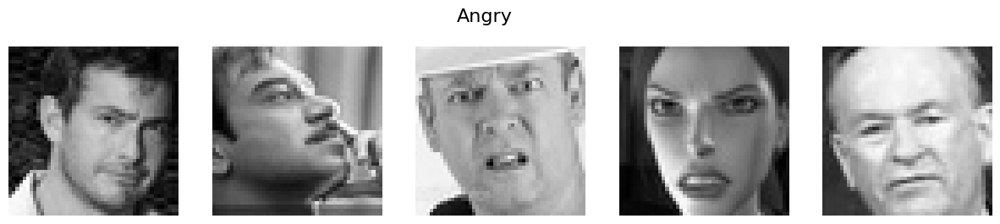

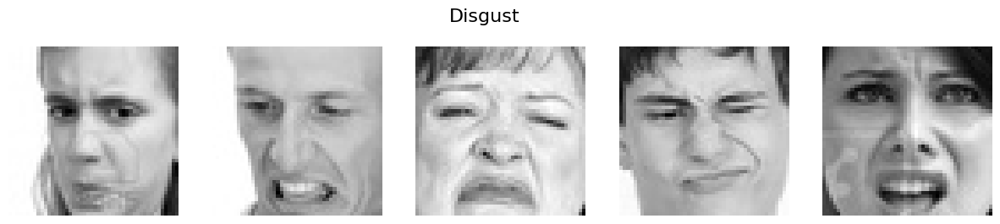

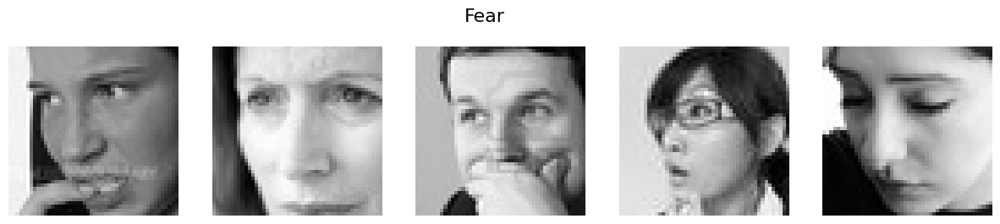

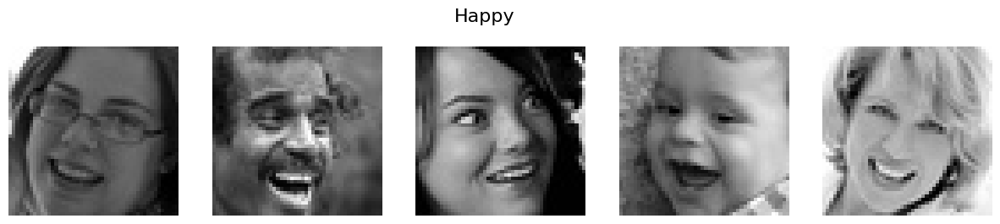

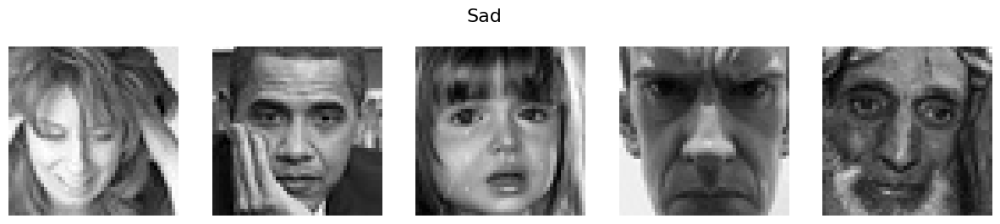

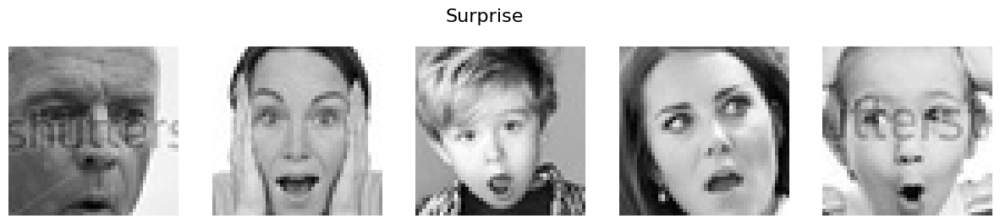

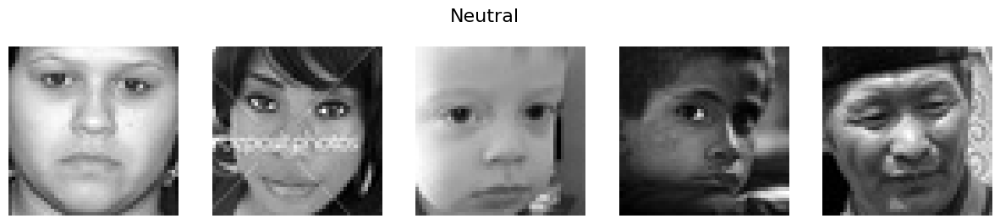

In [ ]:

# Function to display images for each category
def display_images(images, labels, emotion_labels):
    for i, label in enumerate(emotion_labels):
        fig, axes = plt.subplots(1, 5, figsize=(15, 3))
        fig.suptitle(label, fontsize=16)
        indices = np.where(np.argmax(labels, axis=1) == i)[0][:5]  # Show 5 images per category
        for j, idx in enumerate(indices):
            axes[j].imshow(images[idx].reshape(IMG_SIZE, IMG_SIZE), cmap='gray')
            axes[j].axis('off')
        plt.show()

display_images(train_images, train_labels, emotion_labels)

Training fold 1...


c:\Users\Admin\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/5
558/558 ━━━━━━━━━━━━━━━━━━━━ 410s 728ms/step - accuracy: 0.3156 - loss: 1.6843 - val_accuracy: 0.8501 - val_loss: 0.4564
Epoch 2/5
558/558 ━━━━━━━━━━━━━━━━━━━━ 396s 710ms/step - accuracy: 0.8816 - loss: 0.3710 - val_accuracy: 0.9887 - val_loss: 0.0549
Epoch 3/5
558/558 ━━━━━━━━━━━━━━━━━━━━ 391s 701ms/step - accuracy: 0.9834 - loss: 0.0626 - val_accuracy: 0.9645 - val_loss: 0.1113
Epoch 4/5
558/558 ━━━━━━━━━━━━━━━━━━━━ 392s 702ms/step - accuracy: 0.9931 - loss: 0.0269 - val_accuracy: 0.9904 - val_loss: 0.0317
Epoch 5/5
558/558 ━━━━━━━━━━━━━━━━━━━━ 390s 699ms/step - accuracy: 0.9947 - loss: 0.0206 - val_accuracy: 0.9961 - val_loss: 0.0135
Training fold 2...
Epoch 1/5
558/558 ━━━━━━━━━━━━━━━━━━━━ 412s 730ms/step - accuracy: 0.3680 - loss: 1.5580 - val_accuracy: 0.8812 - val_loss: 0.3325
Epoch 2/5
558/558 ━━━━━━━━━━━━━━━━━━━━ 396s 709ms/step - accuracy: 0.9114 - loss: 0.2782 - val_accuracy: 0.9827 - val_loss: 0.0587
Epoch 3/5
558/558 ━━━━━━━━━━━━━━━━━━━━ 401s 718ms/step - accurac

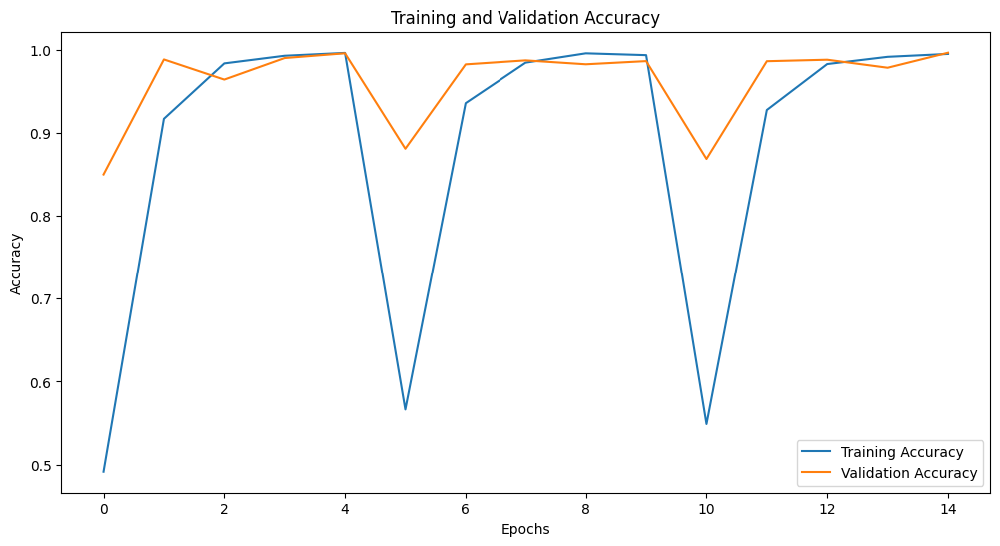

225/225 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step


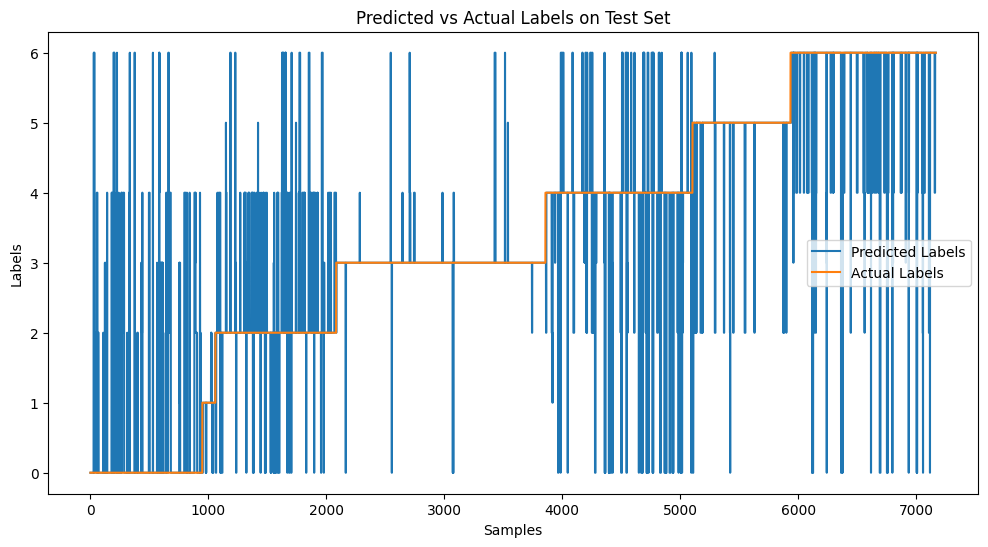

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, LSTM, TimeDistributed, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import KFold
from tensorflow.keras.callbacks import EarlyStopping

# Assuming the following variables are already loaded:
# train_images, train_labels, val_images, val_labels, test_images, test_labels

# Define the sequence length (number of frames per sequence)
SEQUENCE_LENGTH = 10

# Prepare sequences for CNN-LSTM model
def create_sequences(images, labels, seq_length=SEQUENCE_LENGTH):
    sequences = []
    sequence_labels = []
    for i in range(len(images) - seq_length + 1):
        sequences.append(images[i:i + seq_length])
        sequence_labels.append(labels[i + seq_length - 1])  # Label of the last image in the sequence
    return np.array(sequences), np.array(sequence_labels)

train_sequences, train_sequence_labels = create_sequences(train_images, train_labels)

# Define the CNN-LSTM model
def create_model(input_shape):
    model = Sequential()
    model.add(TimeDistributed(Conv2D(32, (3, 3), activation='relu'), input_shape=input_shape))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))
    model.add(TimeDistributed(Flatten()))
    model.add(LSTM(64))
    model.add(Dropout(0.5))
    model.add(Dense(len(emotion_labels), activation='softmax'))
    
    model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# K-Fold Cross-Validation
kf = KFold(n_splits=3, shuffle=True, random_state=42)
fold_no = 1
history = {'accuracy': [], 'val_accuracy': [], 'loss': [], 'val_loss': []}

for train_index, val_index in kf.split(train_sequences):
    print(f"Training fold {fold_no}...")
    
    # Split data into train and validation sets for the current fold
    X_train, X_val = train_sequences[train_index], train_sequences[val_index]
    y_train, y_val = train_sequence_labels[train_index], train_sequence_labels[val_index]
    
    # Create model
    model = create_model((SEQUENCE_LENGTH, IMG_SIZE, IMG_SIZE, 1))
    
    # Train the model
    early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
    history_fold = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=5, batch_size=32, callbacks=[early_stopping])
    
    history['accuracy'].extend(history_fold.history['accuracy'])
    history['val_accuracy'].extend(history_fold.history['val_accuracy'])
    history['loss'].extend(history_fold.history['loss'])
    history['val_loss'].extend(history_fold.history['val_loss'])
    
    fold_no += 1

# Evaluate the model on the test set
test_sequences, test_sequence_labels = create_sequences(test_images, test_labels)
test_loss, test_accuracy = model.evaluate(test_sequences, test_sequence_labels)
print(f'Test Loss: {test_loss}')
print(f'Test Accuracy: {test_accuracy}')

# Save the model
model.save('emotion_recognition_cnn_lstm.h5')

# Plot the training and validation accuracy
plt.figure(figsize=(12, 6))
plt.plot(history['accuracy'], label='Training Accuracy')
plt.plot(history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')
plt.show()

# Predict on test set and plot results
predictions = model.predict(test_sequences)
predicted_labels = np.argmax(predictions, axis=1)
actual_labels = np.argmax(test_sequence_labels, axis=1)

plt.figure(figsize=(12, 6))
plt.plot(predicted_labels, label='Predicted Labels')
plt.plot(actual_labels, label='Actual Labels')
plt.xlabel('Samples')
plt.ylabel('Labels')
plt.legend()
plt.title('Predicted vs Actual Labels on Test Set')
plt.show()


In [1]:
import cv2
import numpy as np
from tensorflow.keras.models import load_model

# Load the trained model and the face cascade
model = load_model('emotion_recognition_cnn_lstm.h5')
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Constants
SEQUENCE_LENGTH = 10
IMG_SIZE = 48
emotion_labels = ['Angry', 'Disgust', 'Fear', 'Happy', 'Sad', 'Surprise', 'Neutral']

# Initialize a buffer to hold frames for sequences
frame_buffer = []

# Preprocess a single frame
def preprocess_frame(frame):
    gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    resized_frame = cv2.resize(gray_frame, (IMG_SIZE, IMG_SIZE))
    normalized_frame = resized_frame.astype('float32') / 255.0
    return normalized_frame

# Start video capture from webcam
cap = cv2.VideoCapture(0)

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break
    
    # Detect faces
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, 1.3, 5)
    
    for (x, y, w, h) in faces:
        # Extract and preprocess the face ROI
        face = frame[y:y+h, x:x+w]
        processed_face = preprocess_frame(face)
        
        # Add to frame buffer
        frame_buffer.append(processed_face)
        
        # Ensure buffer holds only SEQUENCE_LENGTH frames
        if len(frame_buffer) == SEQUENCE_LENGTH:
            # Convert to numpy array and reshape
            sequence = np.array(frame_buffer).reshape(1, SEQUENCE_LENGTH, IMG_SIZE, IMG_SIZE, 1)
            prediction = model.predict(sequence)
            emotion = emotion_labels[np.argmax(prediction)]
            
            # Draw the emotion label on the frame
            cv2.putText(frame, emotion, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
            
            # Clear buffer for the next sequence
            frame_buffer.pop(0)

        # Draw the rectangle around the face
        cv2.rectangle(frame, (x, y), (x + w, y + h), (255, 0, 0), 2)
    
    # Display the frame
    cv2.imshow('Real-time Emotion Detection', frame)
    
    # Break the loop if 'q' is pressed
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Release resources
cap.release()
cv2.destroyAllWindows()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━

KeyboardInterrupt: 

In [1]:
import cv2
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt

# Load the trained model
model = load_model('emotion_recognition_cnn_lstm.h5')

# Define the path to the video file
video_path = 0

# Define the sequence length and image size
SEQUENCE_LENGTH = 10
IMG_SIZE = 48
emotion_labels = ['Angry', 'Disgust', 'Fear', 'Happy', 'Sad', 'Surprise', 'Neutral']

# Function to preprocess frames
def preprocess_frame(frame):
    gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    resized_frame = cv2.resize(gray_frame, (IMG_SIZE, IMG_SIZE))
    normalized_frame = resized_frame.astype('float32') / 255.0
    return normalized_frame

# Function to extract frames from video
def extract_frames_from_video(video_path):
    cap = cv2.VideoCapture(video_path)
    frames = []
    while True:
        ret, frame = cap.read()
        if not ret:
            break
        frames.append(preprocess_frame(frame))
    cap.release()
    return np.array(frames)

# Extract frames from the video
frames = extract_frames_from_video(video_path)

# Create sequences from frames
def create_sequences_from_frames(frames, seq_length=SEQUENCE_LENGTH):
    sequences = []
    for i in range(len(frames) - seq_length + 1):
        sequences.append(frames[i:i + seq_length])
    return np.array(sequences)

frame_sequences = create_sequences_from_frames(frames)

# Reshape sequences for prediction
frame_sequences = frame_sequences.reshape(-1, SEQUENCE_LENGTH, IMG_SIZE, IMG_SIZE, 1)

# Predict emotions for each sequence
predictions = model.predict(frame_sequences)

# Decode predictions
predicted_emotions = [emotion_labels[np.argmax(pred)] for pred in predictions]

# Display predicted emotions
print(predicted_emotions)

# Visualize some frames with predicted emotions
def visualize_predictions(frames, predicted_emotions, seq_length=SEQUENCE_LENGTH):
    for i in range(0, len(predicted_emotions), seq_length):
        plt.figure(figsize=(20, 5))
        for j in range(seq_length):
            plt.subplot(2, seq_length//2, j+1)
            plt.imshow(frames[i + j], cmap='gray')
            plt.title(predicted_emotions[i + j])
            plt.axis('off')
        plt.show()

visualize_predictions(frames, predicted_emotions)


KeyboardInterrupt: 

17/17 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step
['Fear', 'Fear', 'Fear', 'Fear', 'Fear', 'Fear', 'Fear', 'Fear', 'Fear', 'Fear', 'Fear', 'Fear', 'Fear', 'Fear', 'Fear', 'Fear', 'Fear', 'Fear', 'Fear', 'Angry', 'Angry', 'Angry', 'Angry', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Angry', 'Angry', 'Angry', 'Angry', 'Angry', 'Fear', 'Fear', 'Fear', 'Angry', 'Angry', 'Angry', 'Angry', 'Angry', 'Angry', 'Angry', 'Angry', 'Angry', 'Angry', 'Angry', 'Angry', 'Angry', 'Angry', 'Angry', 'Angry', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Angry', 'Angry', 'Angry', 'Angry', 'Angry', 'Angry', 'Angry', 'Angry', 'Angry', 'Angry', 'Angry', 'Angry', 'Angry', 'Angry', 'Angry', 'Angry', 'Angry', 'Angry', 'Angry', 'Angry', 'Angry', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Angry', 'Angry', 'Angry', 'Angry', 'Angry', 'Angry', 'Angry', 'Angr

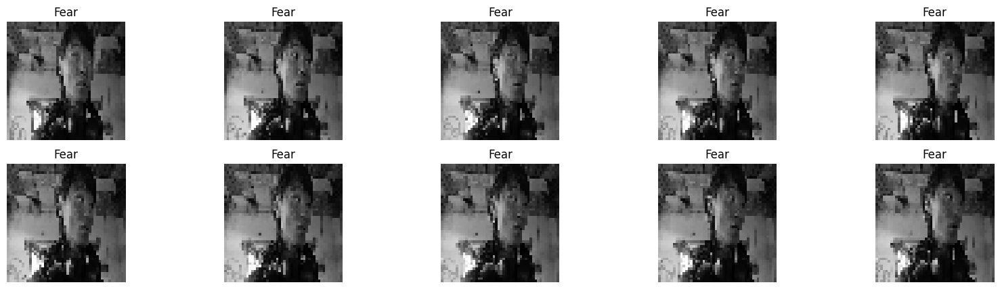

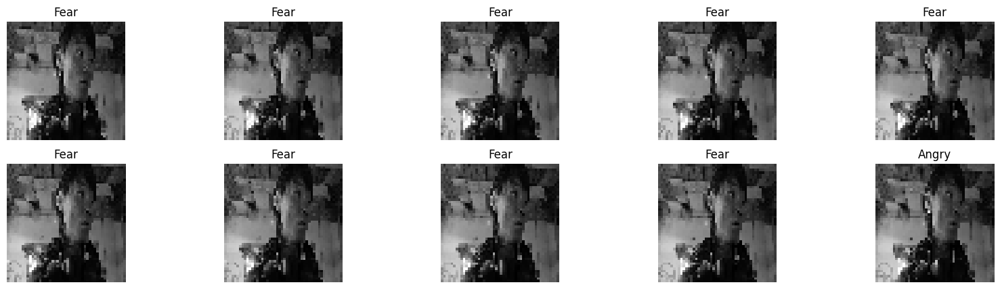

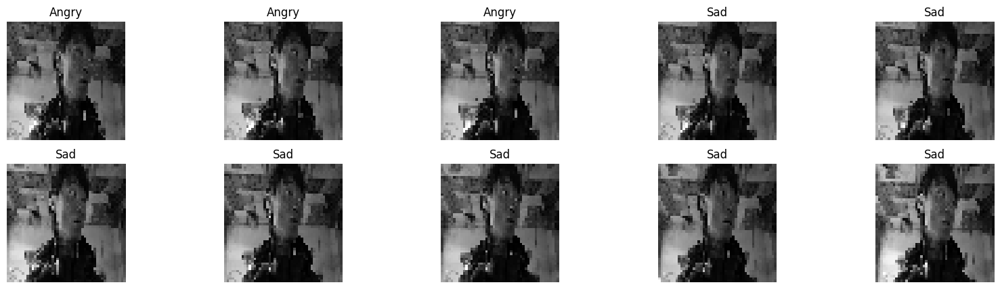

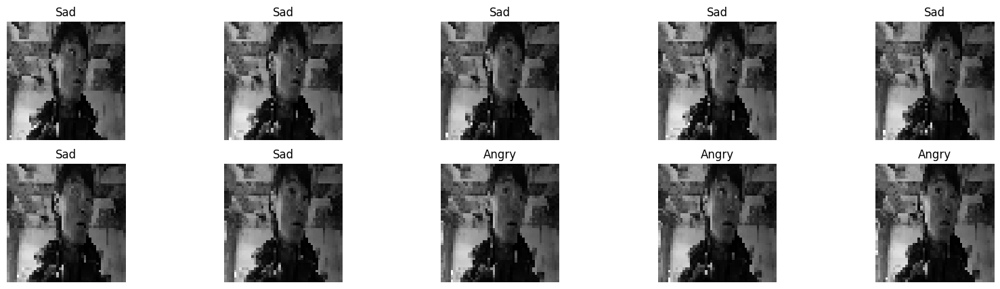

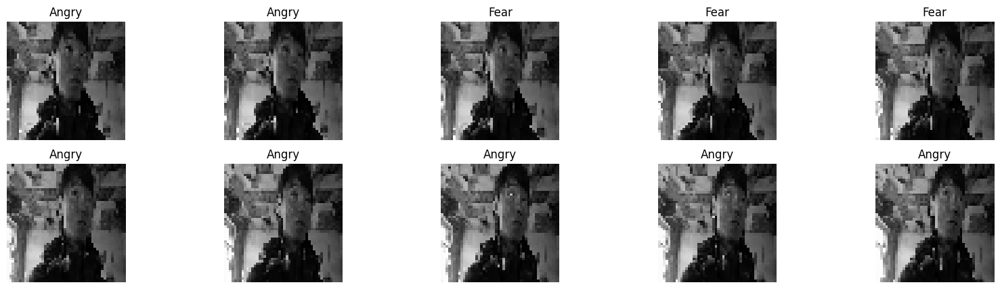

...

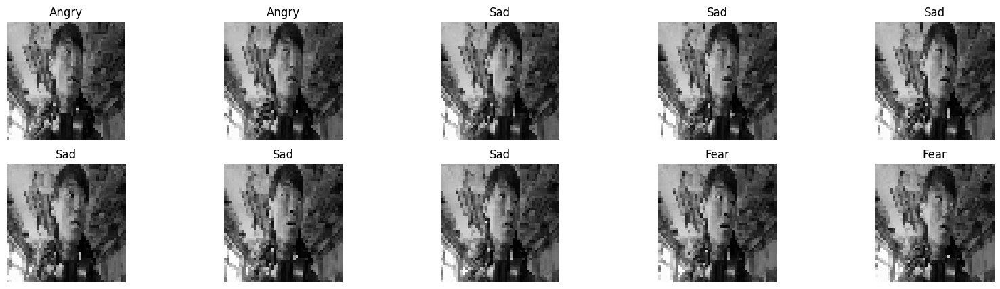

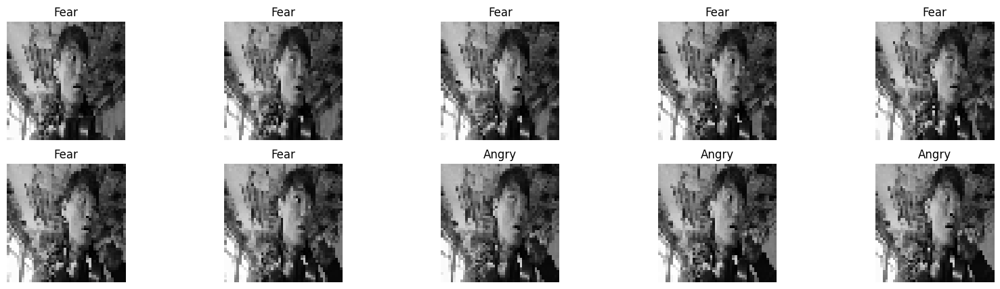

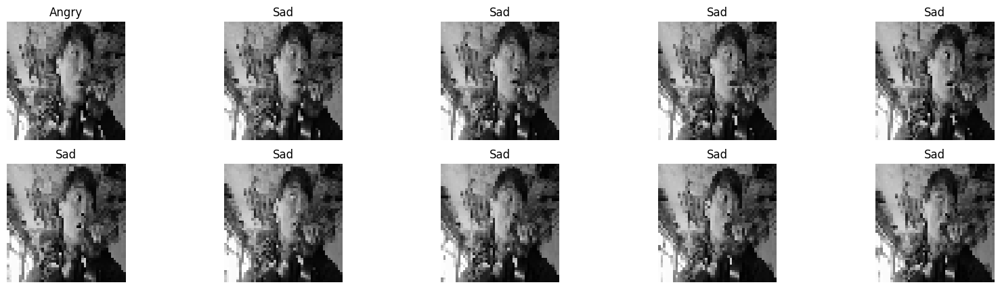

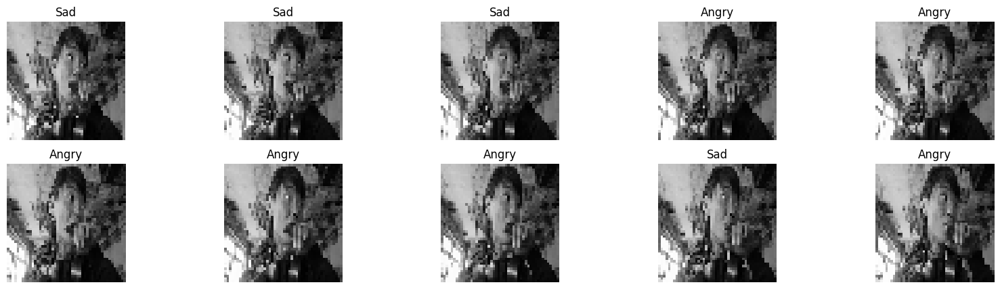

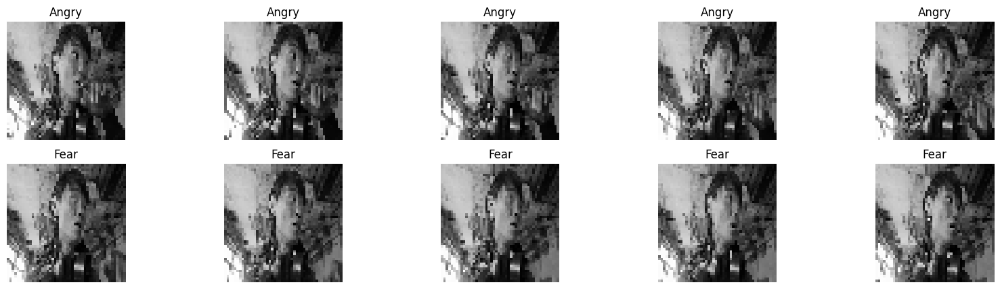

IndexError: list index out of range

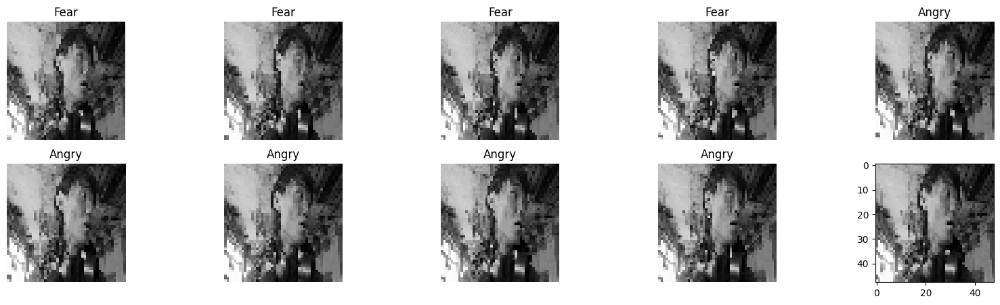

In [ ]:
import cv2
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt

# Load the trained model
model = load_model('emotion_recognition_cnn_lstm.h5')

# Define the path to the video file
video_path = 'fear2.mp4'

# Define the sequence length and image size
SEQUENCE_LENGTH = 10
IMG_SIZE = 48
emotion_labels = ['Angry', 'Disgust', 'Fear', 'Happy', 'Sad', 'Surprise', 'Neutral']

# Function to preprocess frames
def preprocess_frame(frame):
    gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    resized_frame = cv2.resize(gray_frame, (IMG_SIZE, IMG_SIZE))
    normalized_frame = resized_frame.astype('float32') / 255.0
    return normalized_frame

# Function to extract frames from video
def extract_frames_from_video(video_path):
    cap = cv2.VideoCapture(video_path)
    frames = []
    while True:
        ret, frame = cap.read()
        if not ret:
            break
        frames.append(preprocess_frame(frame))
    cap.release()
    return np.array(frames)

# Extract frames from the video
frames = extract_frames_from_video(video_path)

# Create sequences from frames
def create_sequences_from_frames(frames, seq_length=SEQUENCE_LENGTH):
    sequences = []
    for i in range(len(frames) - seq_length + 1):
        sequences.append(frames[i:i + seq_length])
    return np.array(sequences)

frame_sequences = create_sequences_from_frames(frames)

# Reshape sequences for prediction
frame_sequences = frame_sequences.reshape(-1, SEQUENCE_LENGTH, IMG_SIZE, IMG_SIZE, 1)

# Predict emotions for each sequence
predictions = model.predict(frame_sequences)

# Decode predictions
predicted_emotions = [emotion_labels[np.argmax(pred)] for pred in predictions]

# Display predicted emotions
print(predicted_emotions)

# Visualize some frames with predicted emotions
def visualize_predictions(frames, predicted_emotions, seq_length=SEQUENCE_LENGTH):
    for i in range(0, len(predicted_emotions), seq_length):
        plt.figure(figsize=(20, 5))
        for j in range(seq_length):
            plt.subplot(2, seq_length//2, j+1)
            plt.imshow(frames[i + j], cmap='gray')
            plt.title(predicted_emotions[i + j])
            plt.axis('off')
        plt.show()

visualize_predictions(frames, predicted_emotions)


7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 144ms/step
['Happy', 'Happy', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Happy', 'Happy', 'Happy', 'Happy', 'Happy', 'Happy', 'Happy', 'Happy', 'Happy', 'Happy', 'Happy', 'Happy', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Happy', 'Happy', 'Happy', 'Happy', 'Happy', 'Happy', 'Happy', 'Happy', 'Happy', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Neutral', 'Neutral', 'Ne

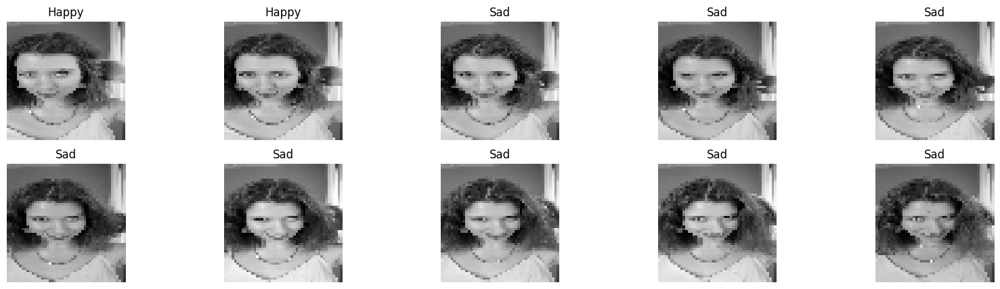

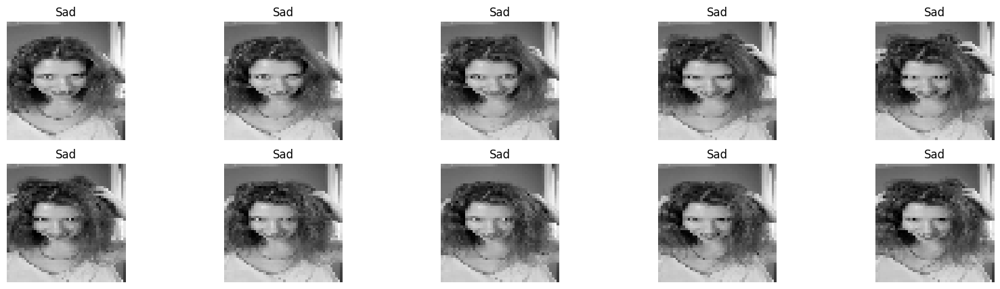

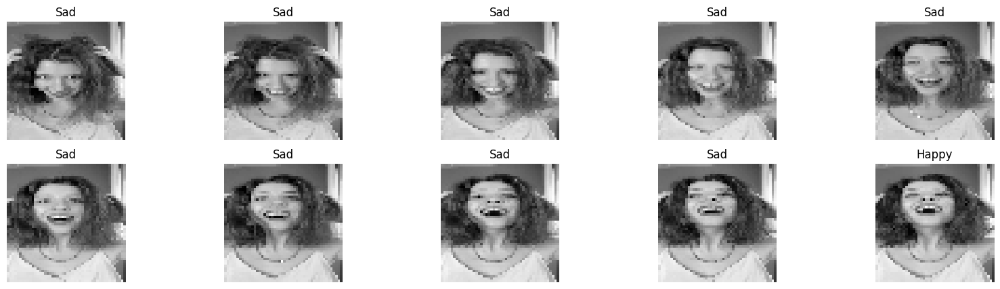

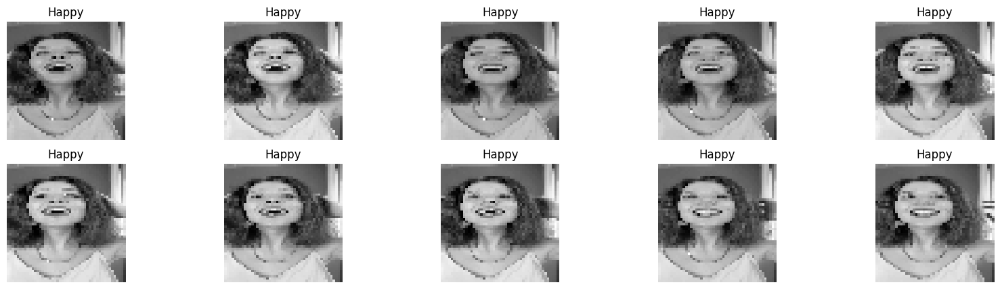

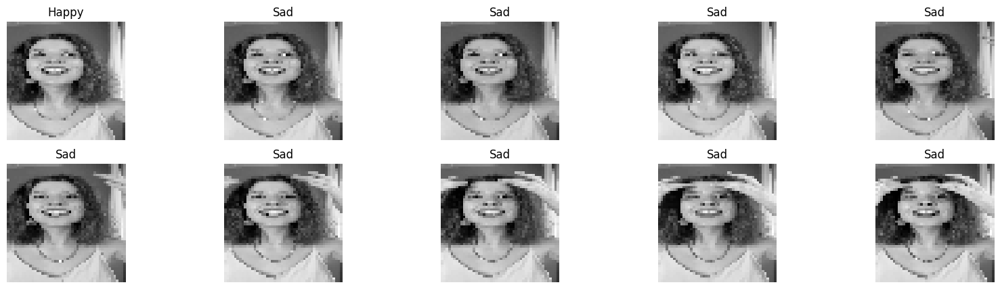

...

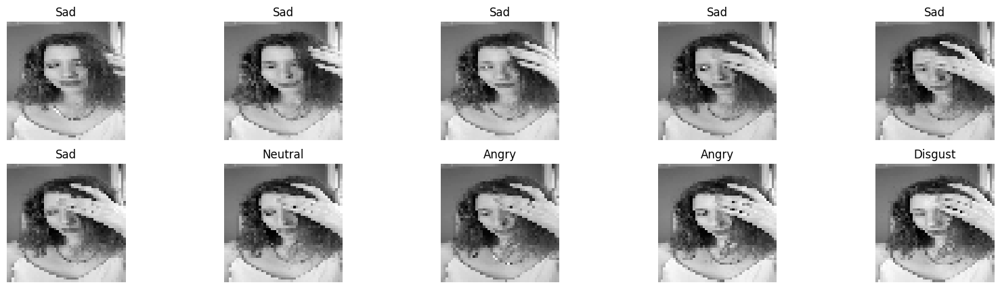

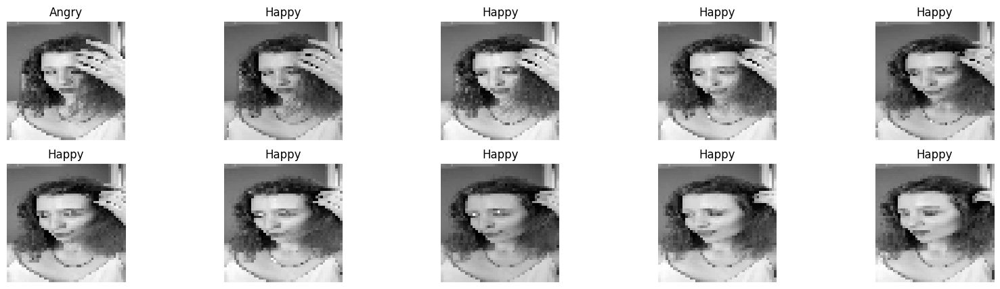

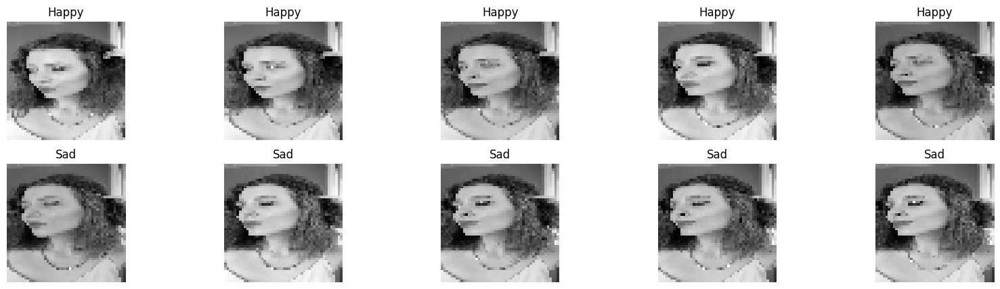

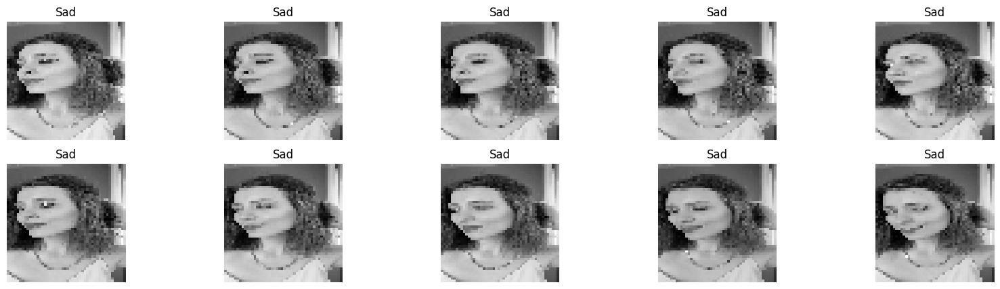

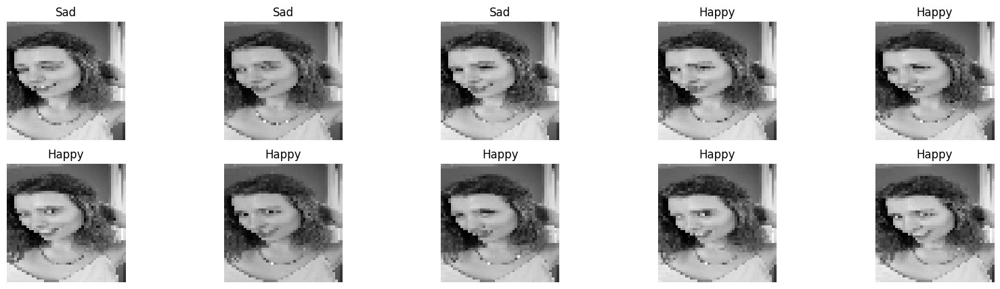

IndexError: list index out of range

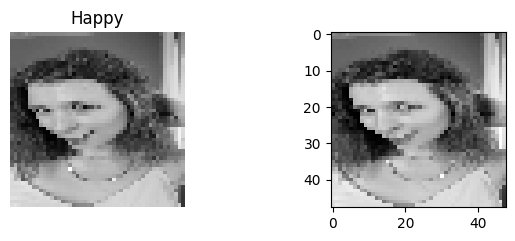

In [ ]:
import cv2
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt

# Load the trained model
model = load_model('emotion_recognition_cnn_lstm.h5')

# Define the path to the video file
video_path = 'face_happy.mp4'

# Define the sequence length and image size
SEQUENCE_LENGTH = 10
IMG_SIZE = 48
emotion_labels = ['Angry', 'Disgust', 'Fear', 'Happy', 'Sad', 'Surprise', 'Neutral']

# Function to preprocess frames
def preprocess_frame(frame):
    gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    resized_frame = cv2.resize(gray_frame, (IMG_SIZE, IMG_SIZE))
    normalized_frame = resized_frame.astype('float32') / 255.0
    return normalized_frame

# Function to extract frames from video
def extract_frames_from_video(video_path):
    cap = cv2.VideoCapture(video_path)
    frames = []
    while True:
        ret, frame = cap.read()
        if not ret:
            break
        frames.append(preprocess_frame(frame))
    cap.release()
    return np.array(frames)

# Extract frames from the video
frames = extract_frames_from_video(video_path)

# Create sequences from frames
def create_sequences_from_frames(frames, seq_length=SEQUENCE_LENGTH):
    sequences = []
    for i in range(len(frames) - seq_length + 1):
        sequences.append(frames[i:i + seq_length])
    return np.array(sequences)

frame_sequences = create_sequences_from_frames(frames)

# Reshape sequences for prediction
frame_sequences = frame_sequences.reshape(-1, SEQUENCE_LENGTH, IMG_SIZE, IMG_SIZE, 1)

# Predict emotions for each sequence
predictions = model.predict(frame_sequences)

# Decode predictions
predicted_emotions = [emotion_labels[np.argmax(pred)] for pred in predictions]

# Display predicted emotions
print(predicted_emotions)

# Visualize some frames with predicted emotions
def visualize_predictions(frames, predicted_emotions, seq_length=SEQUENCE_LENGTH):
    for i in range(0, len(predicted_emotions), seq_length):
        plt.figure(figsize=(20, 5))
        for j in range(seq_length):
            plt.subplot(2, seq_length//2, j+1)
            plt.imshow(frames[i + j], cmap='gray')
            plt.title(predicted_emotions[i + j])
            plt.axis('off')
        plt.show()

visualize_predictions(frames, predicted_emotions)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 89ms/step
['Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Neutral', 'Neutral', 'Neutral', 'Neutral', 'Neutral', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Neutral', 'Neutral', 'Neutral', 'Neutral', 'Neutral', 'Neutral', 'Neutral', 'Neutral', 'Neutral', 'Neutral', 'Neutral', 'Neutral', 'Neutral', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad', 'Sad'

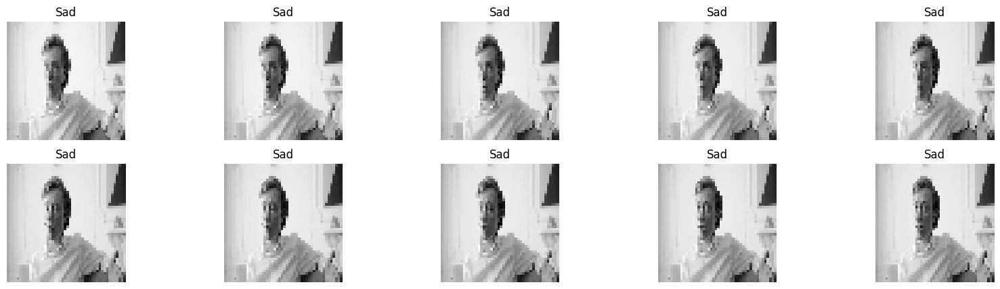

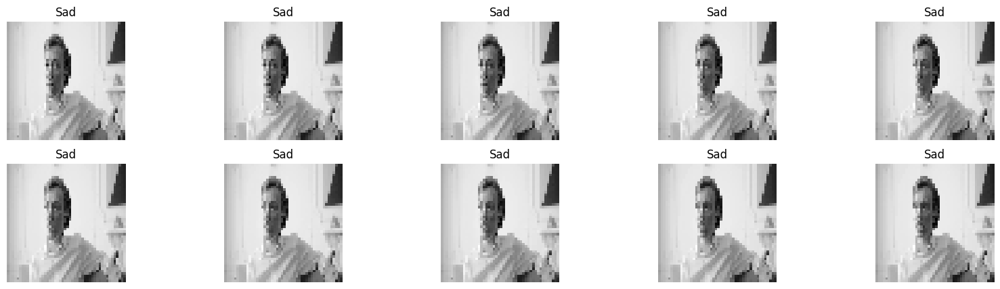

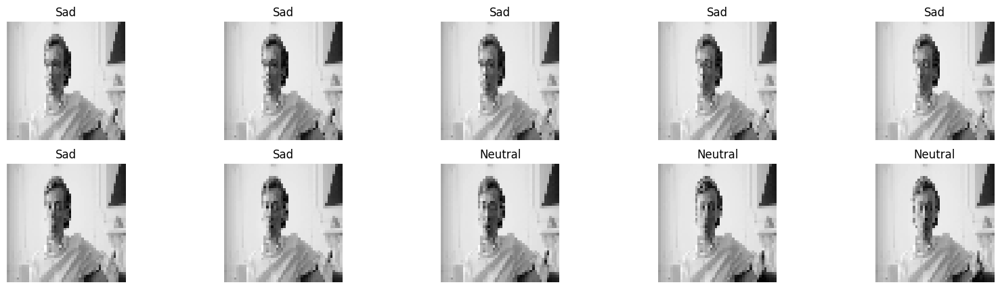

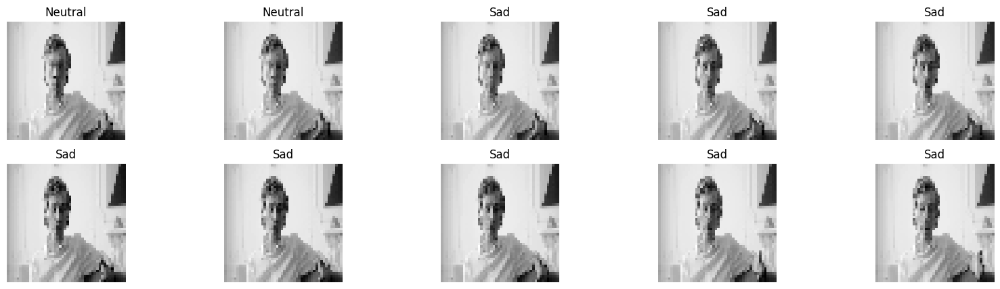

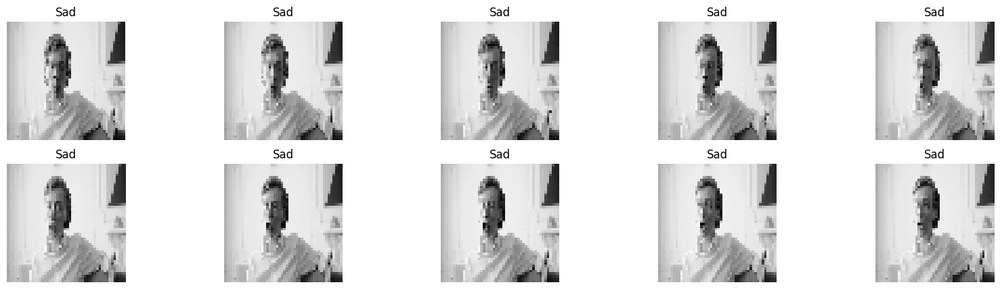

...

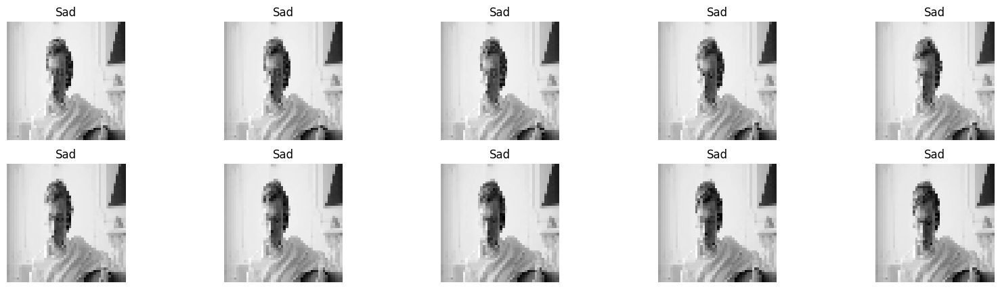

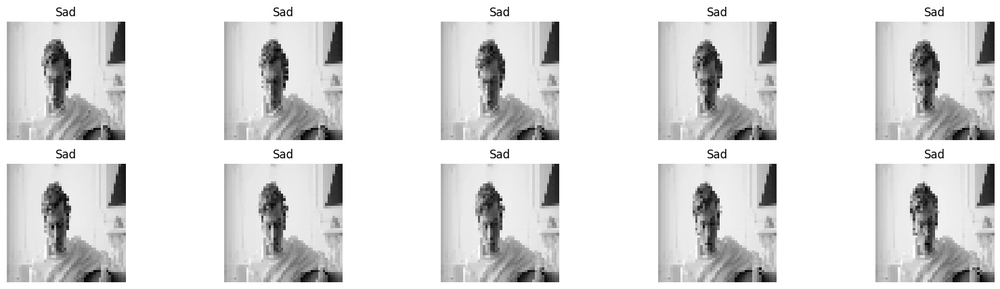

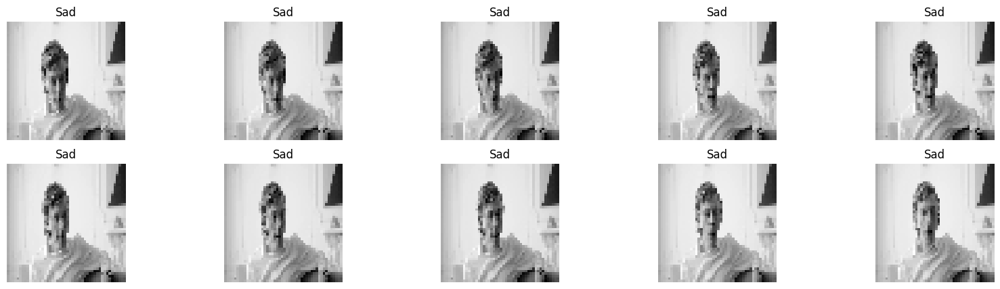

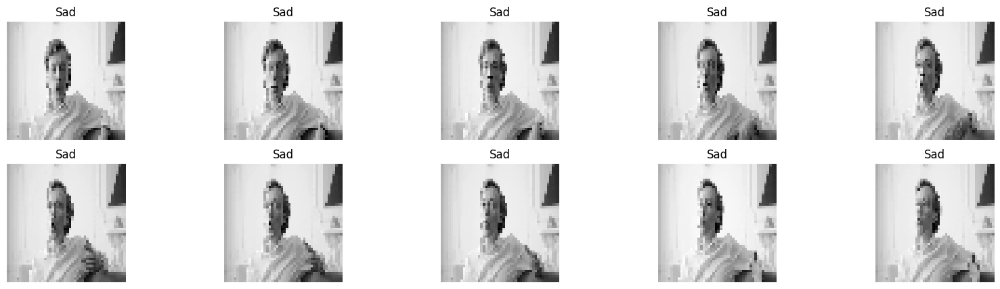

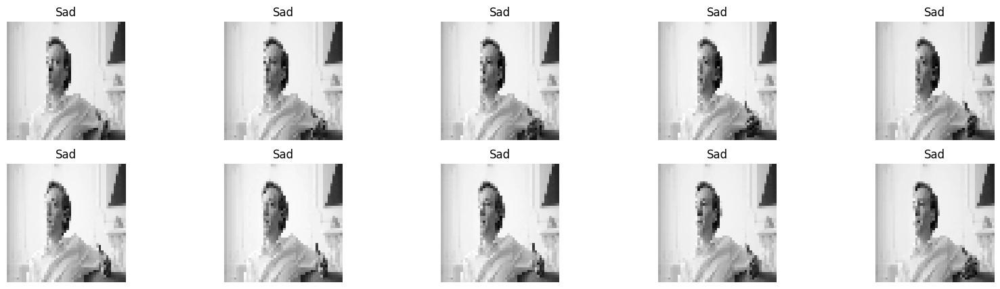

IndexError: list index out of range

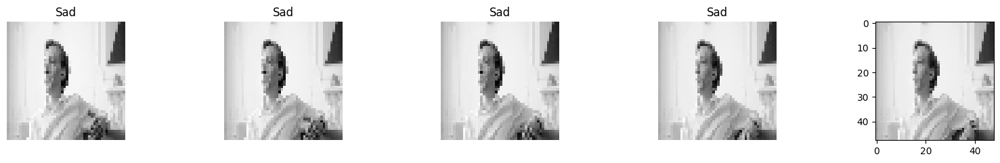

In [ ]:
import cv2
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt

# Load the trained model
model = load_model('emotion_recognition_cnn_lstm.h5')

# Define the path to the video file
video_path = 'angry.mp4'

# Define the sequence length and image size
SEQUENCE_LENGTH = 10
IMG_SIZE = 48
emotion_labels = ['Angry', 'Disgust', 'Fear', 'Happy', 'Sad', 'Surprise', 'Neutral']

# Function to preprocess frames
def preprocess_frame(frame):
    gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    resized_frame = cv2.resize(gray_frame, (IMG_SIZE, IMG_SIZE))
    normalized_frame = resized_frame.astype('float32') / 255.0
    return normalized_frame

# Function to extract frames from video
def extract_frames_from_video(video_path):
    cap = cv2.VideoCapture(video_path)
    frames = []
    while True:
        ret, frame = cap.read()
        if not ret:
            break
        frames.append(preprocess_frame(frame))
    cap.release()
    return np.array(frames)

# Extract frames from the video
frames = extract_frames_from_video(video_path)

# Create sequences from frames
def create_sequences_from_frames(frames, seq_length=SEQUENCE_LENGTH):
    sequences = []
    for i in range(len(frames) - seq_length + 1):
        sequences.append(frames[i:i + seq_length])
    return np.array(sequences)

frame_sequences = create_sequences_from_frames(frames)

# Reshape sequences for prediction
frame_sequences = frame_sequences.reshape(-1, SEQUENCE_LENGTH, IMG_SIZE, IMG_SIZE, 1)

# Predict emotions for each sequence
predictions = model.predict(frame_sequences)

# Decode predictions
predicted_emotions = [emotion_labels[np.argmax(pred)] for pred in predictions]

# Display predicted emotions
print(predicted_emotions)

# Visualize some frames with predicted emotions
def visualize_predictions(frames, predicted_emotions, seq_length=SEQUENCE_LENGTH):
    for i in range(0, len(predicted_emotions), seq_length):
        plt.figure(figsize=(20, 5))
        for j in range(seq_length):
            plt.subplot(2, seq_length//2, j+1)
            plt.imshow(frames[i + j], cmap='gray')
            plt.title(predicted_emotions[i + j])
            plt.axis('off')
        plt.show()

visualize_predictions(frames, predicted_emotions)
